In [ ]:
import torch
print("GPU available:", torch.cuda.is_available())
print("Device:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")

GPU available: True
Device: Tesla T4


In [ ]:
!git clone https://github.com/yz93/LAVT-RIS.git
%cd /content/LAVT-RIS
!ls

fatal: destination path 'LAVT-RIS' already exists and is not an empty directory.
/content/LAVT-RIS
args.py  demo_inference.py  pipeline.jpg  requirements.txt  transforms.py
bert	 lib		    README.md	  test.py	    utils.py
data	 LICENSE	    refer	  train.py


In [ ]:
!pip install -q -U transformers timm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 93.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 106.8 MB/s eta 0:00:00


In [ ]:
import torch
import timm
import cv2
import einops
from transformers import BertTokenizer

print("torch:", torch.__version__)
print("timm:", timm.__version__)
print("transformers:", __import__('transformers').__version__)

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
print("BertTokenizer works!")
print("All OK!")

torch: 2.10.0+cu128
timm: 1.0.26
transformers: 5.5.4


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

BertTokenizer works!
All OK!


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil, os

os.makedirs('/content/LAVT-RIS/weights', exist_ok=True)


shutil.copy('/content/drive/MyDrive/refcoco.pth','/content/LAVT-RIS/weights/refcoco.pth')


!ls -lh /content/LAVT-RIS/weights/

total 2.3G
-rw------- 1 root root 2.3G Apr 20 18:40 refcoco.pth


In [ ]:
import torch

checkpoint = torch.load('/content/LAVT-RIS/weights/refcoco.pth',
    map_location='cpu',
    weights_only=False)

print(type(checkpoint))
if isinstance(checkpoint, dict):
    print("Top-level keys:", list(checkpoint.keys()))

<class 'dict'>
Top-level keys: ['model', 'bert_model', 'optimizer', 'epoch', 'args', 'lr_scheduler']


In [ ]:
import sys
sys.path.insert(0, '/content/LAVT-RIS')

print("Trained with args:")
print(checkpoint['args'])
print("\nepoch:", checkpoint['epoch'])

Trained with args:
Namespace(add_token=True, binary_eval=False, both_emb=False, custom_test=False, max_tokens=10, model_id='refvos_C4C3C2Cat_unifiedswin_ImgNet22KPre_swin-base-window12_scratch_refcoco_adamw_b32lr0.00005wd1e-2_W0.91.1_printGradNorm_E40_DDP_tanhGating_vismmGELUDrop0_QINWIN_vltsizing480', metric_pos=False, metric_pull=False, annotator=1, dataset='refcoco', model='unified_swin_transformer', low_level='C3', clip_lang_model=False, clip_full_model=False, aux_loss=False, lang_att=False, multi_lang_att=False, pix_lang_att=False, cat_words=False, multiply_words=False, batch_size=8, base_size=520, crop_size=480, trans_v2=False, fgbg=False, semantic=False, joint_semantic=False, use_weight=True, concat_1617=False, se_tanh=False, se_sigm=False, se_tanh_lan=False, opt_mag_sig_gate=False, opt_fusion_add=False, init_4chann_fusion_add=False, opt_fusion_conv_proj=False, clip_grad_norm=0.0, clip_grad_norm_bert=0.0, clip_grad_norm_mulLan=0.0, clip_grad_norm_clip_lang=0.0, analyze=False, pr

In [ ]:
!sed -i 's/import mmcv/#import mmcv/' /content/LAVT-RIS/lib/mmcv_custom/checkpoint.py
!sed -i 's/from mmcv/#from mmcv/' /content/LAVT-RIS/lib/mmcv_custom/checkpoint.py

!head -25 /content/LAVT-RIS/lib/mmcv_custom/checkpoint.py

# Copyright (c) Open-MMLab. All rights reserved.
import io
import os
import os.path as osp
import pkgutil
import time
import warnings
from collections import OrderedDict
from importlib import import_module
from tempfile import TemporaryDirectory

import torch
import torchvision
from torch.optim import Optimizer
from torch.utils import model_zoo
from torch.nn import functional as F

#import mmcv
#from mmcv.fileio import FileClient
#from mmcv.fileio import load as load_file
#from mmcv.parallel import is_module_wrapper
#from mmcv.utils import mkdir_or_exist
#from mmcv.runner import get_dist_info

ENV_MMCV_HOME = 'MMCV_HOME'


In [ ]:
!sed -i 's/from mmseg.utils import get_root_logger/#from mmseg.utils import get_root_logger/' /content/LAVT-RIS/lib/backbone.py


!sed -i 's/logger = get_root_logger()/#logger = get_root_logger()/' /content/LAVT-RIS/lib/backbone.py

!grep -n "mmseg\|get_root_logger" /content/LAVT-RIS/lib/backbone.py

8:#from mmseg.utils import get_root_logger
455:            #logger = get_root_logger()


In [ ]:
!ls /content/LAVT-RIS/lib/
!grep -n "def \|register" /content/LAVT-RIS/lib/segmentation.py | head -30

backbone.py	   mmcv_custom	segmentation.py
mask_predictor.py  __pycache__	_utils.py
11:def _segm_lavt(pretrained, args):
68:def _load_model_lavt(pretrained, args):
73:def lavt(pretrained='', args=None):
80:def _segm_lavt_one(pretrained, args):
137:def _load_model_lavt_one(pretrained, args):
142:def lavt_one(pretrained='', args=None):


In [ ]:
from transformers import BertModel as HFBertModel

bert_model = HFBertModel.from_pretrained('bert-base-uncased')
bert_model.pooler = None
bert_weights = checkpoint['bert_model']
bert_model.load_state_dict(bert_weights, strict=False)
bert_model = bert_model.to(device)
bert_model.eval()
print("BERT loaded")

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
print("tokenizer loaded!")

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-uncased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


BERT loaded!
Tokenizer loaded!

All components ready!


In [ ]:
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch.nn.functional as F


image_ref_pairs = [("ILSVRC2012_test_00000003.jpg", "The walking dog in the picture"),
    ("ILSVRC2012_test_00000004.jpg", "The smiling dog in the grass"),
    ("ILSVRC2012_test_00000018.jpg", "The boy on left smiling and holding icecream"),
    ("ILSVRC2012_test_00000019.jpg", "The black gray bird on in the picture"),
    ("ILSVRC2012_test_00000022.jpg", "The sad dog standing beside the pool"),
    ("ILSVRC2012_test_00000023.jpg", "The guy in white shirt on the bicycle"),
    ("ILSVRC2012_test_00000025.jpg", "The butterfly in the picture"),
    ("ILSVRC2012_test_00000026.jpg", "The mang wearing a suite and tie"),
    ("ILSVRC2012_test_00000030.jpg", "The duck in the picture"),
    ("ILSVRC2012_test_00000034.jpg", "The white coffee cups on the coffee machine"),]

image_dir = "/content/sample_images/samples/"

transform = transforms.Compose([
    transforms.Resize((480, 480)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])

def run_seg(img_filename, ref_text):
    img_path = image_dir + img_filename
    img = Image.open(img_path).convert("RGB")
    img_tensor = transform(img).unsqueeze(0).to(device)


    tokens = tokenizer(ref_text,
        padding='max_length',
        max_length=args.max_tokens,
        truncation=True,
        return_tensors='pt')
    input_ids = tokens['input_ids'].to(device)
    attention_mask = tokens['attention_mask'].to(device)

    with torch.no_grad():
        bert_out = bert_model(input_ids=input_ids, attention_mask=attention_mask)
        l_feats = bert_out.last_hidden_state      
        l_feats = l_feats.permute(0, 2, 1)           
        l_mask = attention_mask.unsqueeze(dim=-1)     

    with torch.no_grad():
        output = model(img_tensor, l_feats, l_mask)

    pred_mask = torch.sigmoid(output).squeeze().cpu().numpy()
    if pred_mask.ndim == 3:
        pred_mask = pred_mask[0]
    pred_mask_binary = (pred_mask > 0.5).astype(np.uint8)
    return img, pred_mask, pred_mask_binary

Processing: ILSVRC2012_test_00000003.jpg


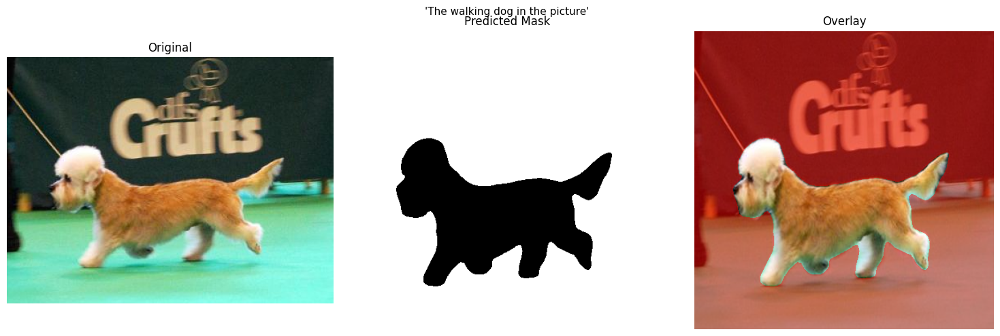

✅ Done: ILSVRC2012_test_00000003.jpg

Processing: ILSVRC2012_test_00000004.jpg


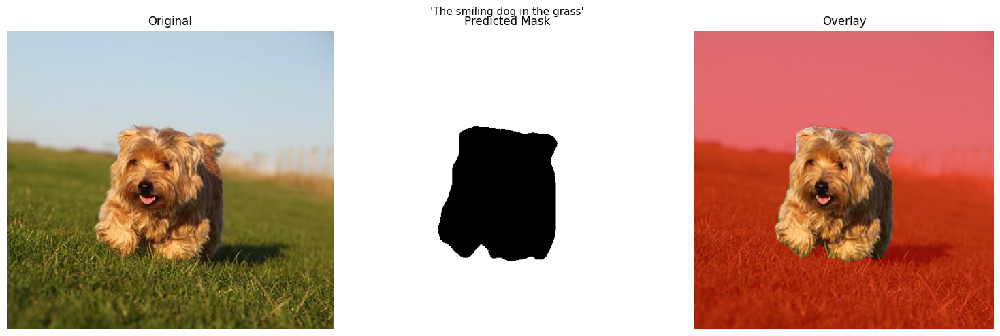

✅ Done: ILSVRC2012_test_00000004.jpg

Processing: ILSVRC2012_test_00000018.jpg


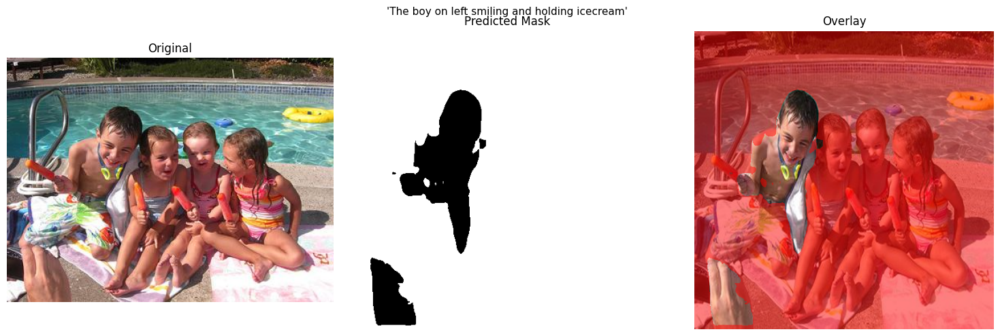

✅ Done: ILSVRC2012_test_00000018.jpg

Processing: ILSVRC2012_test_00000019.jpg


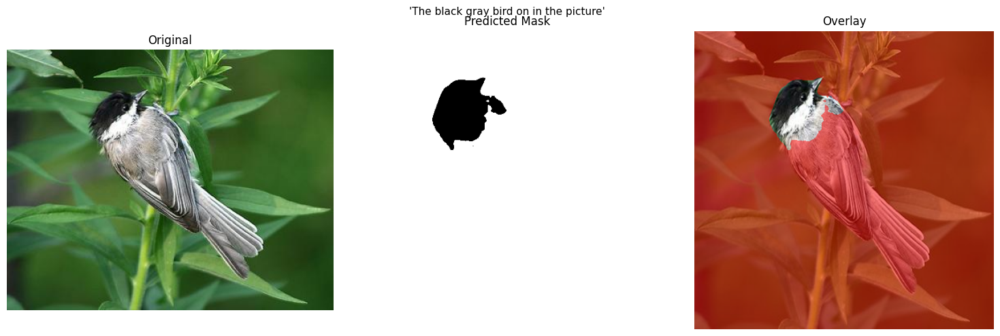

✅ Done: ILSVRC2012_test_00000019.jpg

Processing: ILSVRC2012_test_00000022.jpg


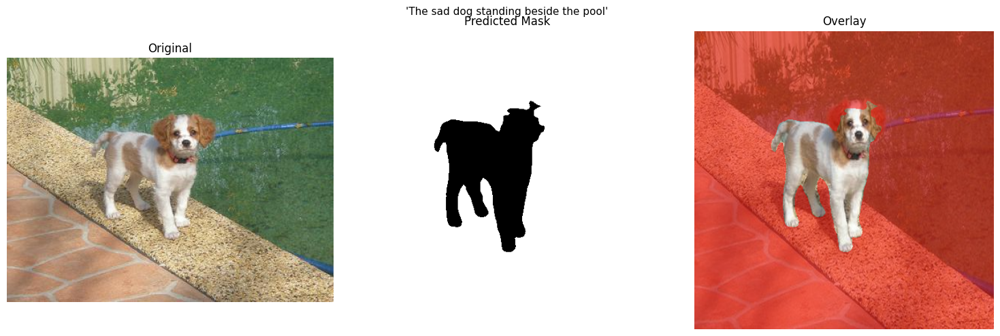

✅ Done: ILSVRC2012_test_00000022.jpg

Processing: ILSVRC2012_test_00000023.jpg


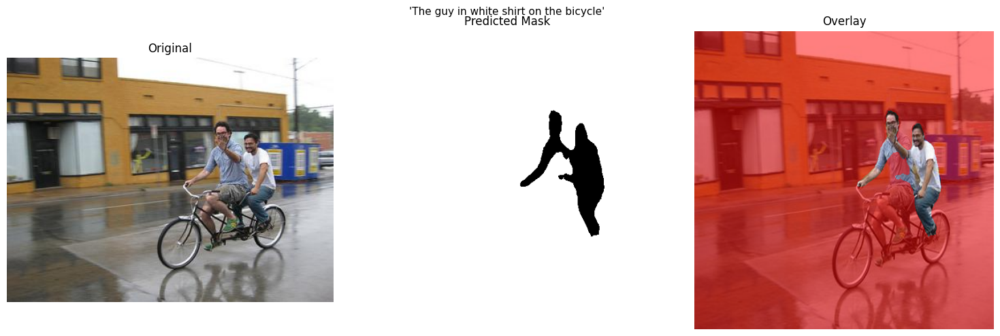

✅ Done: ILSVRC2012_test_00000023.jpg

Processing: ILSVRC2012_test_00000025.jpg


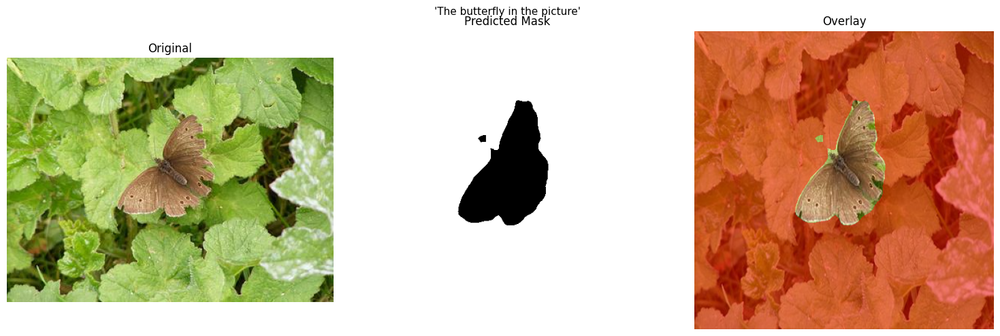

✅ Done: ILSVRC2012_test_00000025.jpg

Processing: ILSVRC2012_test_00000026.jpg


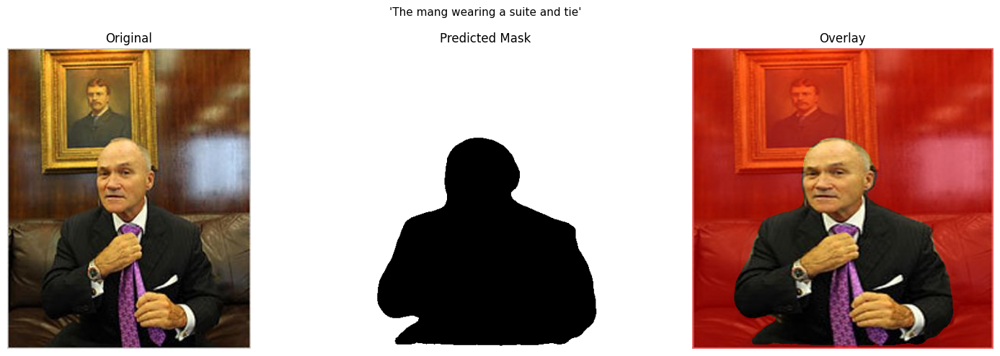

✅ Done: ILSVRC2012_test_00000026.jpg

Processing: ILSVRC2012_test_00000030.jpg


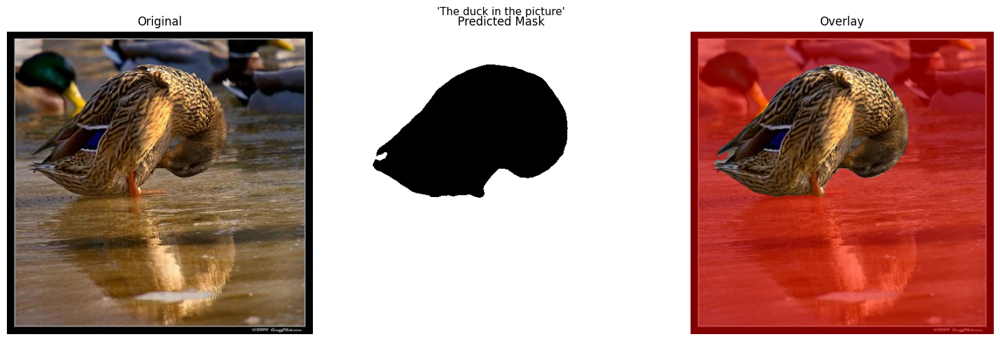

✅ Done: ILSVRC2012_test_00000030.jpg

Processing: ILSVRC2012_test_00000034.jpg


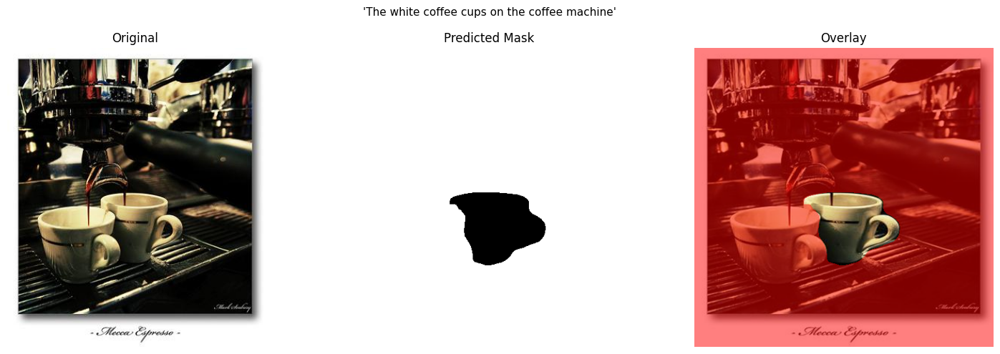

✅ Done: ILSVRC2012_test_00000034.jpg



In [ ]:
for img_filename, ref_text in image_ref_pairs:
    print(f"processing: {img_filename}")
    try:
        img, pred_mask, pred_mask_binary = run_seg(img_filename, ref_text)

        if pred_mask.ndim == 3:
            pred_mask = pred_mask[0]
            pred_mask_binary = pred_mask_binary[0]

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        axes[0].imshow(img)
        axes[0].set_title("original")
        axes[0].axis('off')

        axes[1].imshow(pred_mask_binary, cmap='gray')
        axes[1].set_title("predicted mask")
        axes[1].axis('off')

        img_resized = np.array(img.resize((480, 480)))
        overlay = img_resized.copy().astype(float)
        overlay[pred_mask_binary == 1] = (overlay[pred_mask_binary == 1] * 0.5 +np.array([255, 0, 0]) * 0.5)
        axes[2].imshow(overlay.astype(np.uint8))
        axes[2].set_title("overlay")
        axes[2].axis('off')

        plt.suptitle(f"'{ref_text}'", fontsize=11)
        plt.tight_layout()
        plt.savefig(f"/content/seg_{img_filename}", dpi=150)
        plt.show()
        print(f"Done: {img_filename}\n")

    except Exception as e:
        print(f"Failed: {img_filename} — {e}\n")

Y1 feature map: ILSVRC2012_test_00000003.jpg
  Y1 raw shape: torch.Size([14400, 128])


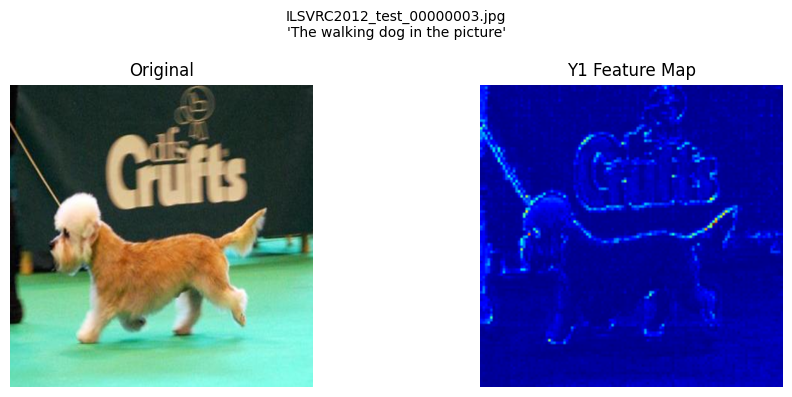

Y1 feature map: ILSVRC2012_test_00000004.jpg
  Y1 raw shape: torch.Size([14400, 128])


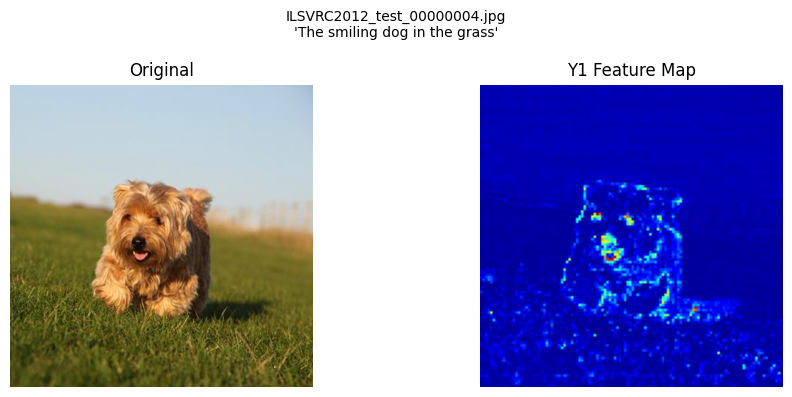

Y1 feature map: ILSVRC2012_test_00000018.jpg
  Y1 raw shape: torch.Size([14400, 128])


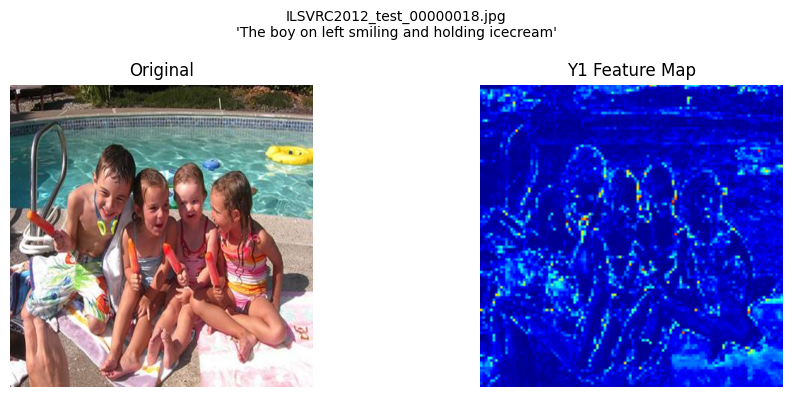

Y1 feature map: ILSVRC2012_test_00000019.jpg
  Y1 raw shape: torch.Size([14400, 128])


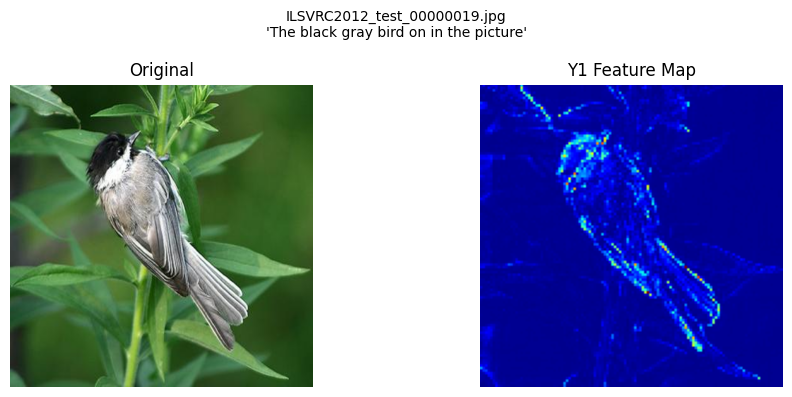

Y1 feature map: ILSVRC2012_test_00000022.jpg
  Y1 raw shape: torch.Size([14400, 128])


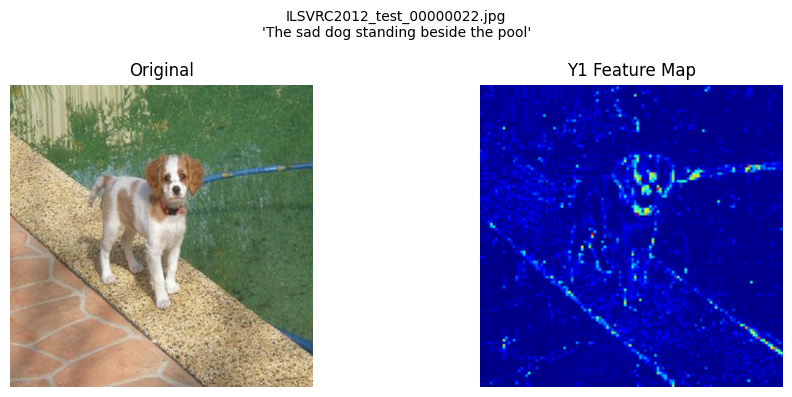

Y1 feature map: ILSVRC2012_test_00000023.jpg
  Y1 raw shape: torch.Size([14400, 128])


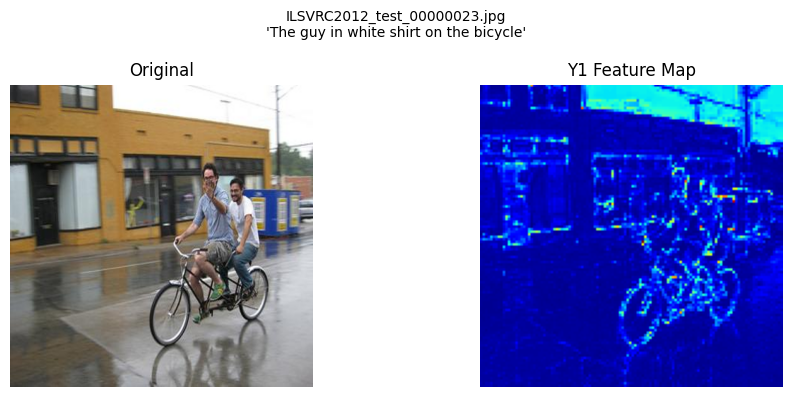

Y1 feature map: ILSVRC2012_test_00000025.jpg
  Y1 raw shape: torch.Size([14400, 128])


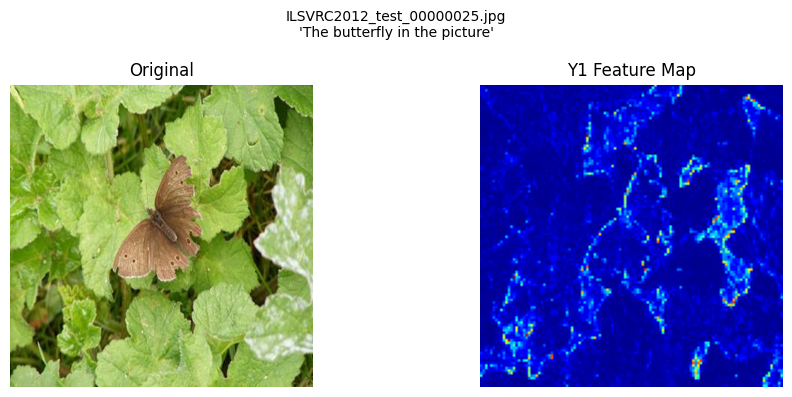

Y1 feature map: ILSVRC2012_test_00000026.jpg
  Y1 raw shape: torch.Size([14400, 128])


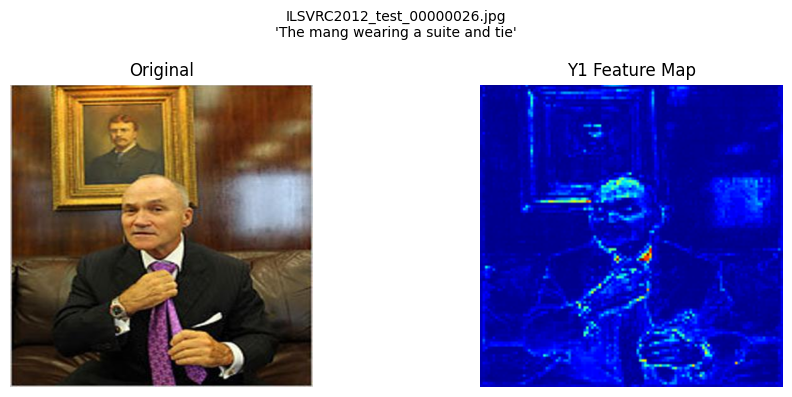

Y1 feature map: ILSVRC2012_test_00000030.jpg
  Y1 raw shape: torch.Size([14400, 128])


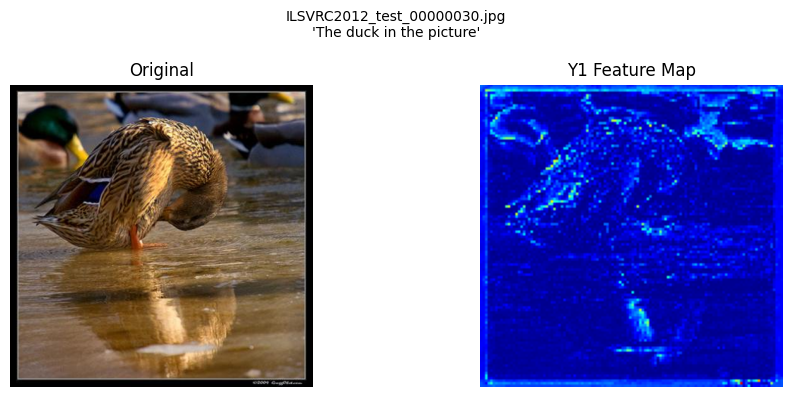

Y1 feature map: ILSVRC2012_test_00000034.jpg
  Y1 raw shape: torch.Size([14400, 128])


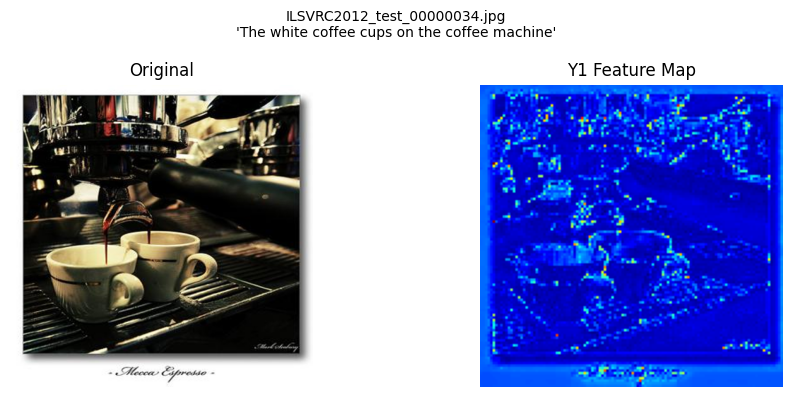

Done! Hook removed.


In [ ]:
y1_store = {}

def hook_fn(module, input, output):
    if isinstance(output, tuple):
        y1_store['y1'] = output[0].detach().cpu()
    else:
        y1_store['y1'] = output.detach().cpu()

hook = model.backbone.layers[0].register_forward_hook(hook_fn)

for img_filename, ref_text in image_ref_pairs:
    print(f"Y1 feature map: {img_filename}")
    img = Image.open(image_dir + img_filename).convert("RGB")
    img_tensor = transform(img).unsqueeze(0).to(device)

    tokens = tokenizer(ref_text, padding='max_length', max_length=args.max_tokens,truncation=True, return_tensors='pt')
    input_ids = tokens['input_ids'].to(device)
    attention_mask = tokens['attention_mask'].to(device)

    with torch.no_grad():
        bert_out = bert_model(input_ids=input_ids, attention_mask=attention_mask)
        l_feats = bert_out.last_hidden_state.permute(0, 2, 1)
        l_mask = attention_mask.unsqueeze(dim=-1)
        _ = model(img_tensor, l_feats, l_mask)

    y1 = y1_store['y1'].squeeze(0) 
    print(f"  Y1 raw shape: {y1.shape}")
    if y1.ndim == 2:
        HW, C = y1.shape
        H = W = int(HW ** 0.5)
        y1 = y1.reshape(H, W, C)


    y1_vis = y1.mean(dim=-1).numpy()

    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    axes[0].imshow(img.resize((480, 480)))
    axes[0].set_title("Original")
    axes[0].axis('off')
    axes[1].imshow(y1_vis, cmap='jet')
    axes[1].set_title(f"Y1 Feature Map")
    axes[1].axis('off')
    plt.suptitle(f"{img_filename}\n'{ref_text}'", fontsize=10)
    plt.tight_layout()
    plt.savefig(f"/content/y1_{img_filename}", dpi=150)
    plt.show()

hook.remove()

=== FAILURE CASES ===

Processing: ILSVRC2012_test_00000003.jpg | Ref: 'the cat sitting on a chair'


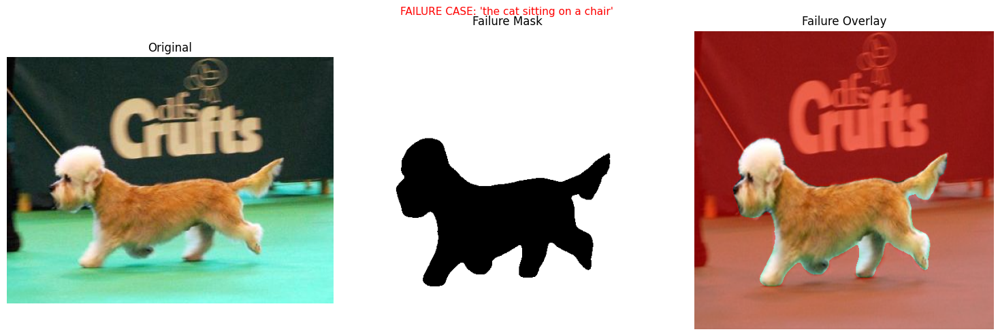

✅ Done

Processing: ILSVRC2012_test_00000004.jpg | Ref: 'the person wearing a red hat'


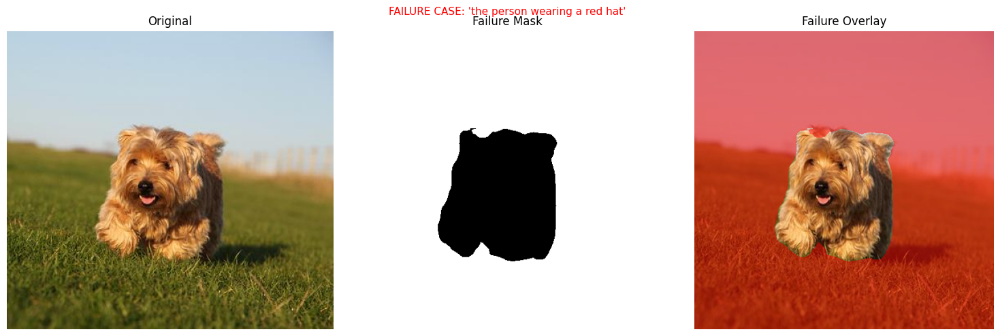

✅ Done

Processing: ILSVRC2012_test_00000018.jpg | Ref: 'the girl on the right with glasses'


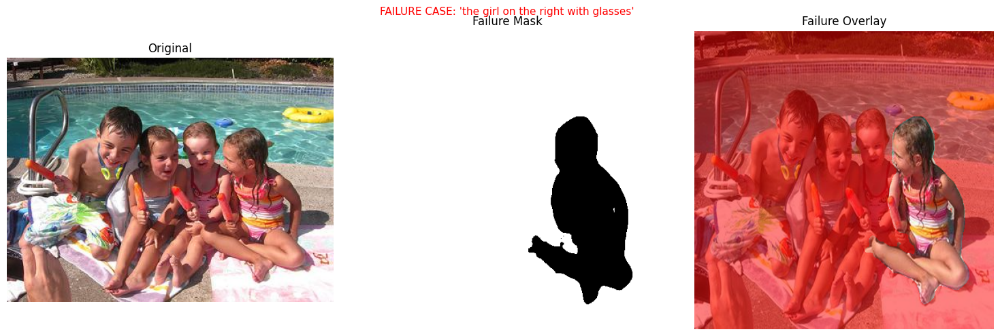

✅ Done

Processing: ILSVRC2012_test_00000022.jpg | Ref: 'the fish swimming in the pool'


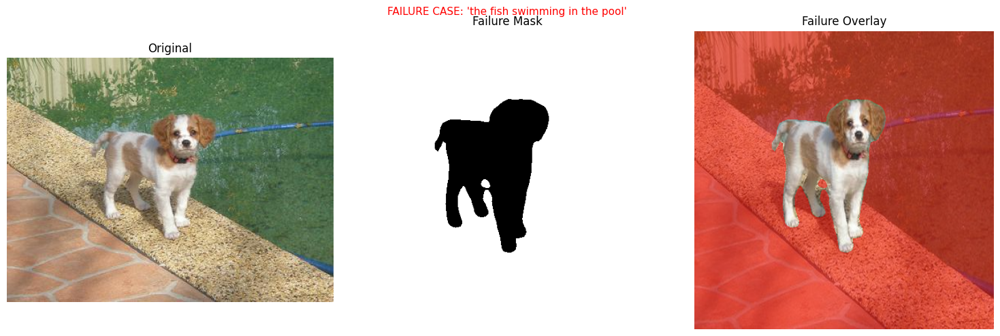

✅ Done

Processing: ILSVRC2012_test_00000025.jpg | Ref: 'the dog running in the field'


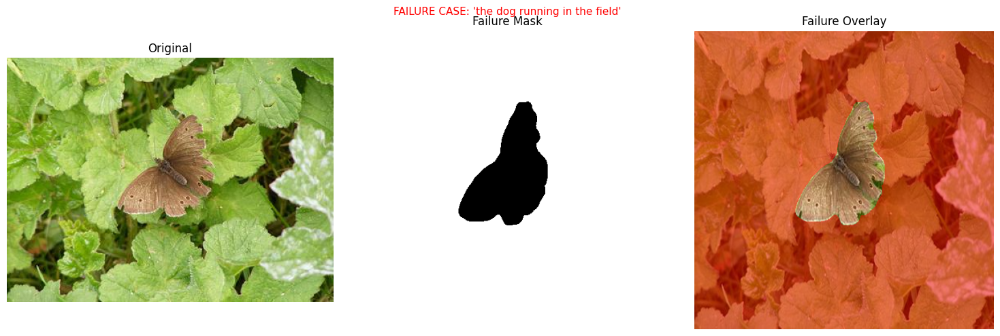

✅ Done



In [ ]:
failure_refs = [("ILSVRC2012_test_00000003.jpg", "the cat sitting on a chair"),
    ("ILSVRC2012_test_00000004.jpg", "the person wearing a red hat"),
    ("ILSVRC2012_test_00000018.jpg", "the girl on the right with glasses"),
    ("ILSVRC2012_test_00000022.jpg", "the fish swimming in the pool"),
    ("ILSVRC2012_test_00000025.jpg", "the dog running in the field"),]

print("FAILURE CASES\n")
for img_filename, ref_text in failure_refs:
    print(f"Processing: {img_filename} | Ref: '{ref_text}'")
    try:
        img, pred_mask, pred_mask_binary = run_seg(img_filename, ref_text)

        if pred_mask.ndim == 3:
            pred_mask = pred_mask[0]
            pred_mask_binary = pred_mask_binary[0]

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(img)
        axes[0].set_title("Original")
        axes[0].axis('off')
        axes[1].imshow(pred_mask_binary, cmap='gray')
        axes[1].set_title("Failure Mask")
        axes[1].axis('off')
        img_resized = np.array(img.resize((480, 480)))
        overlay = img_resized.copy().astype(float)
        overlay[pred_mask_binary == 1] = (
            overlay[pred_mask_binary == 1] * 0.5 +
            np.array([255, 0, 0]) * 0.5
        )
        axes[2].imshow(overlay.astype(np.uint8))
        axes[2].set_title("Failure Overlay")
        axes[2].axis('off')
        plt.suptitle(f"FAILURE CASE: '{ref_text}'", fontsize=11, color='red')
        plt.tight_layout()
        plt.savefig(f"/content/fail_{img_filename}", dpi=150)
        plt.show()
        print(f"done\n")

    except Exception as e:
        print(f"error: {e}\n")